In [1]:
import torch
from torch import Tensor, nn
import torch.nn.functional as F
from tabulate import tabulate
import numpy
import matplotlib.pyplot as plt
import random
from pprint import pprint
import einops
from einops import einsum

from typing import Any, Callable, Literal, TypeAlias
from jaxtyping import Float, Int

from IPython.display import HTML, IFrame, display
from datasets import load_dataset
from huggingface_hub import hf_hub_download

import circuitsvis as cv
import plotly.express as px
import sae_lens
from sae_lens import SAE, ActivationsStore, HookedSAETransformer, LanguageModelSAERunnerConfig
from sae_lens.loading.pretrained_saes_directory import get_pretrained_saes_directory

from torch.nn import functional as F
from tqdm.auto import tqdm
from transformer_lens import ActivationCache, HookedTransformer
from transformer_lens.hook_points import HookPoint
from transformer_lens.utils import get_act_name, test_prompt, to_numpy

from rich import print as rprint
from rich.table import Table

from interp_utils import SAEStore
from interp_utils import get_layer_attributions, decomposed_head_attribs
from plot_utils import visualize_transformer_attributions, get_and_visualize_model_attributions
from data_support import cameron_list, bond_list

In [2]:
# setting-up HookedSAETransformer and SAEStore

In [3]:
sae_model: HookedSAETransformer = HookedSAETransformer.from_pretrained("gpt2-small")

release_name = "gpt2-small-res-jb"
sae_store = SAEStore(release_name=release_name, use_error_term=True, device="cuda")

sae_cfg = list(sae_store.sae_dict.values())[0]['cfg']

Loaded pretrained model gpt2-small into HookedTransformer


loading saes:   0%|          | 0/13 [00:00<?, ?it/s]

/home/happyinterp/miniconda3/envs/mech-interp/lib/python3.11/site-packages/sae_lens/saes/sae.py:249: UserWarning: 
This SAE has non-empty model_from_pretrained_kwargs. 
For optimal performance, load the model like so:
model = HookedSAETransformer.from_pretrained_no_processing(..., **cfg.model_from_pretrained_kwargs)
  warnings.warn(


In [4]:
# Identifying MLP Layer using DLA

In [5]:
text = "James"
target_idx = sae_model.to_single_token(' Cameron')
target_idx = 2922
sae_model.to_str_tokens(text)
# sae_model.to_string(target_idx)

sorted_logits, sorted_ids = sae_model(text)[0, -1].sort(dim=-1)    # top 10 logits
for i in range(10):
    print(f"{sorted_logits[-(i+1)]:.4f} - {sae_model.to_str_tokens(sorted_ids[-(i+1)])[0]}")

12.2264 -  D
11.8687 -  O
11.6550 -  "
11.5390 -  C
11.5380 -  T
11.5193 -  Bond
11.4888 -  M
11.4600 -  Cameron
11.3738 -  H
11.3610 - ,


In [6]:
print(sae_model.to_tokens(" Bond"))
print(sae_model.to_tokens(" Cameron"))

tensor([[50256, 12812]], device='cuda:0')
tensor([[50256, 10821]], device='cuda:0')


In [7]:
_, cache = sae_model.run_with_cache("James", remove_batch_dim=True)
print(torch.sort(get_layer_attributions(sae_model, typ="mlp", cache=cache, target_idx=12812), descending=True))
print(torch.sort(get_layer_attributions(sae_model, typ="mlp", cache=cache, target_idx=10821), descending=True))

torch.return_types.sort(
values=tensor([24.2018, 14.9366, 14.7732, 13.5231, 11.8006,  9.2648,  7.9848,  7.4539,
         5.1702,  3.0706,  1.8508,  1.4017]),
indices=tensor([11,  0,  9,  8, 10,  7,  6,  5,  1,  2,  4,  3]))
torch.return_types.sort(
values=tensor([27.2531, 16.1212, 11.1538,  9.8978,  8.5566,  7.8097,  7.6665,  6.9012,
         6.5303,  3.7361,  3.5614,  0.3699]),
indices=tensor([11,  0,  7,  6,  1,  8,  5,  9, 10,  2,  4,  3]))


/home/happyinterp/main/3m/jupyter/llm-interp-practice/marjor-project-demo/interp_utils.py:63: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:835.)
  return torch.tensor(attrib_list)


In [8]:
# get_and_visualize_model_attributions(
#     model=sae_model,
#     input_str="James",
#     target_idx = 12812,
#     show_node_labels=False,
#     use_normalized_colors=True,
#     show_colorbar=True,
#     save_path=None,
# )

In [9]:
# Identifying MLP Layer using DLA

In [10]:
# hook_sae_input | hook_sae_acts_pre | hook_sae_acts_post | hook_sae_recons   : blocks.i.hook_resid_pre
_, sae_cache = sae_model.run_with_cache_with_saes(
    "James",
    saes=[sae["sae"] for sae in list(sae_store.sae_dict.values())],
    remove_batch_dim=True,
)

In [15]:
len(bond_list), len(cameron_list)

(30, 30)

In [20]:
sae_cfg["metadata"]["hook_name"]

'blocks.0.hook_resid_pre'

In [58]:
torch.zeros((len(bond_list), sae_model.cfg.n_layers, sae_cfg['d_sae']))

names_filter = [f"{hook_name}.hook_sae_acts_post" for hook_name in sae_store.sae_dict.keys()][:-1]

_, bond_sae_cache = sae_model.run_with_cache_with_saes(
    bond_list,
    saes=[sae["sae"] for sae in list(sae_store.sae_dict.values())],
    names_filter=names_filter,
)

_, cameron_sae_cache = sae_model.run_with_cache_with_saes(
    cameron_list,
    saes=[sae["sae"] for sae in list(sae_store.sae_dict.values())],
    names_filter=names_filter,
)

# for layer in range(sae_model.cfg.n_layers):
#     sae_acts_post = sae_cache[f"{sae_cfg['metadata']['hook_name']}.hook_sae_acts_post"][-1]
        

In [69]:
bond_sae_cache["blocks.0.hook_resid_pre.hook_sae_acts_post"].size()    # num_seqs, seq_len, sae_dim    
cameron_sae_cache["blocks.0.hook_resid_pre.hook_sae_acts_post"].size() # num_seqs, seq_len, sae_dim

torch.Size([30, 15, 24576])

In [101]:
def get_token_pos(
    model: HookedSAETransformer,
    sample: str,
    target_token: str,
):
    for i, token in enumerate(model.to_str_tokens(sample)):
        if token == target_token:
            return i
    return None


only_bond_cache = torch.zeros((len(bond_list), sae_model.cfg.n_layers, 24576), device="cuda")
only_cameron_cache = torch.zeros((len(bond_list), sae_model.cfg.n_layers, 24576), device="cuda")

for sample_idx, (bond_sample, cameron_sample) in enumerate(zip(bond_list, cameron_list)):
    bond_pos = get_token_pos(sae_model, bond_sample, " Bond")
    cameron_pos = get_token_pos(sae_model, cameron_sample, " Cameron")
    assert bond_pos is not None, f"' Bond' not found in sample {sample_idx}"
    assert cameron_pos is not None, f"' Cameron' not found in sample {sample_idx}"
    
    for layer in range(sae_model.cfg.n_layers):
        layer_name = f"blocks.{layer}.hook_resid_pre.hook_sae_acts_post"

        only_bond_cache[sample_idx, layer]  = bond_sae_cache[layer_name][sample_idx, bond_pos, :]
        only_cameron_cache[sample_idx, layer] = cameron_sae_cache[layer_name][sample_idx, cameron_pos, :]


In [102]:
only_bond_cache.size(), only_cameron_cache.size()

(torch.Size([30, 12, 24576]), torch.Size([30, 12, 24576]))

In [115]:
def display_dashboard(
    sae_release="gpt2-small-res-jb",
    sae_id="blocks.11.hook_resid_pre",
    latent_idx=0,
    width=800,
    height=600,
):
    release = get_pretrained_saes_directory()[sae_release]
    neuronpedia_id = release.neuronpedia_id[sae_id]

    url = f"https://neuronpedia.org/{neuronpedia_id}/{latent_idx}?embed=true&embedexplanation=true&embedplots=true&embedtest=true&height=300"

    print(url)
    display(IFrame(url, width=width, height=height))


# latent_idx = 9    # not every new is the same, the new which interests a neuron could be different from a new in your mind
# latent_idx = 24111    # CNN neuron. highly sparse latent, so is interpretable af
# latent_idx = 13    # a mild concpet level feature[activations_density < 0.05]. activates for words like victory, win, winning, and similar kind of shit
# latent_idx = 67    # activates on country's decisions, government policies and like shit. high concept feature[high activations density].

# latent_idx = random.randint(0, sae_model.cfg.d_sae)
display_dashboard(latent_idx=9196)   # 140, 13212, 2127


https://neuronpedia.org/gpt2-small/11-res-jb/9196?embed=true&embedexplanation=true&embedplots=true&embedtest=true&height=300


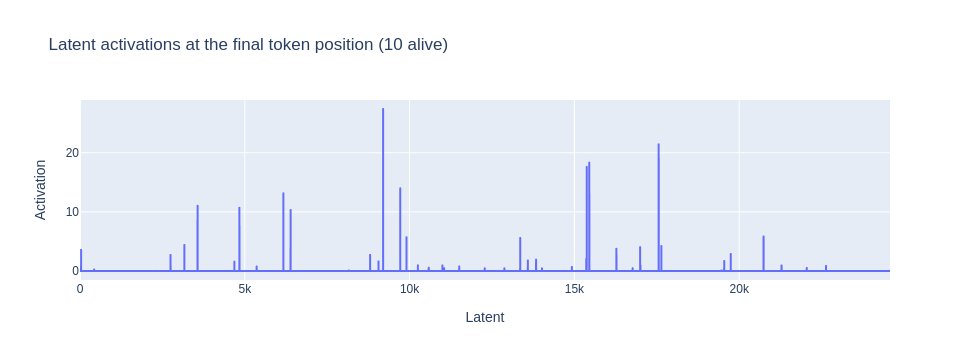

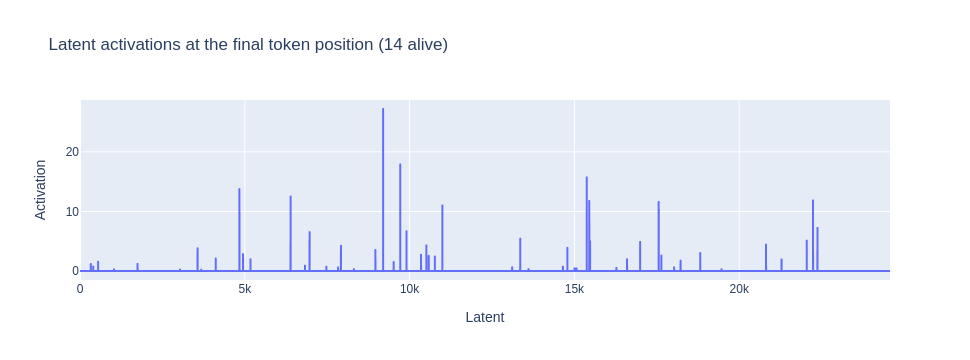

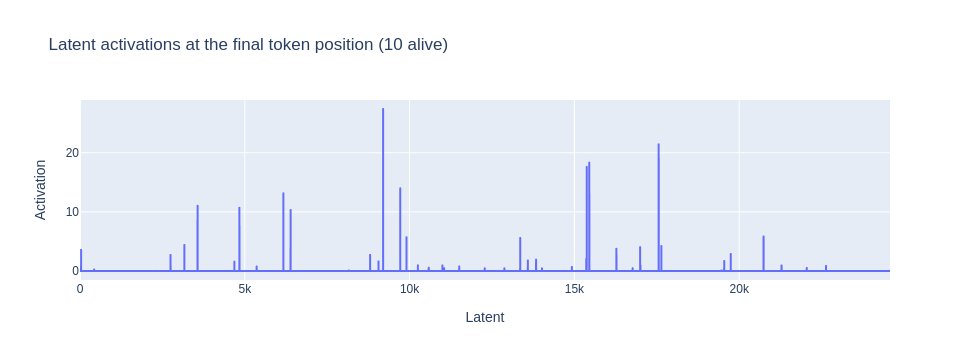

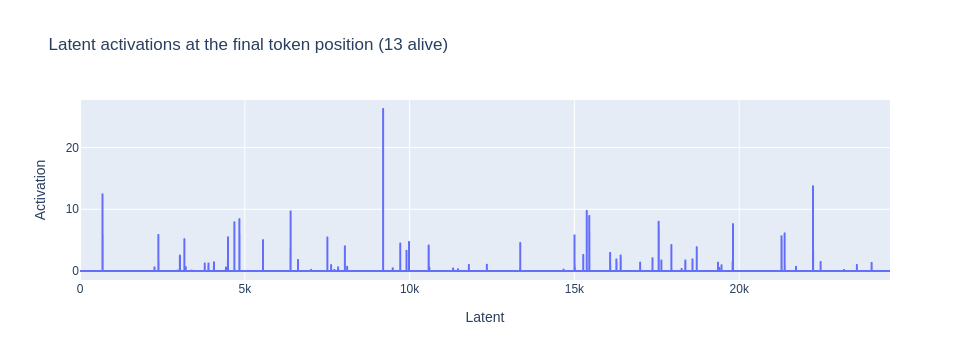

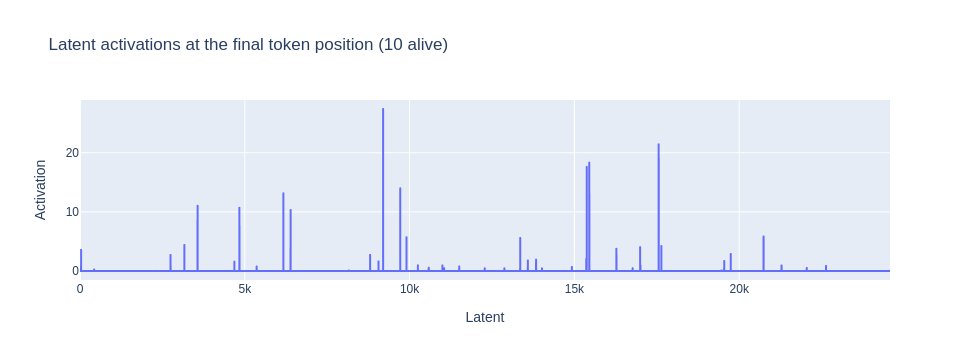

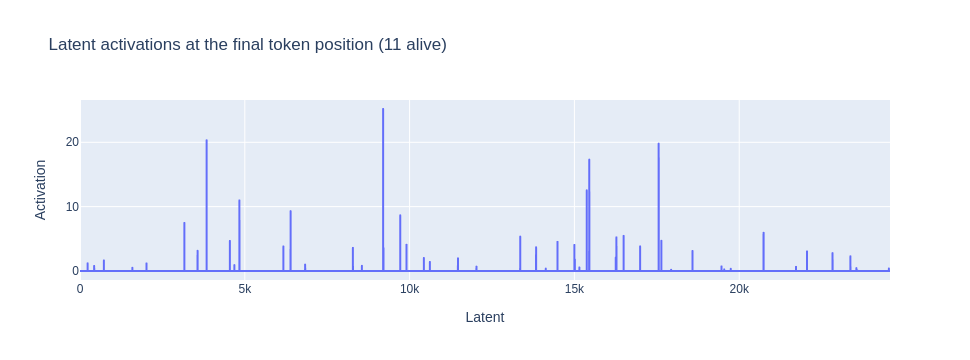

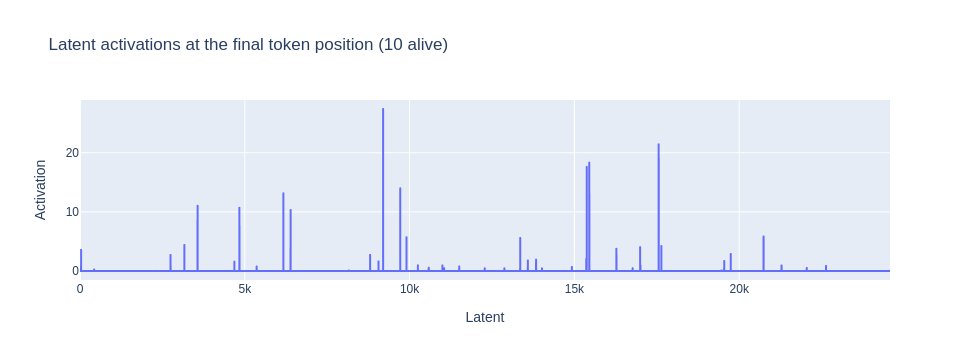

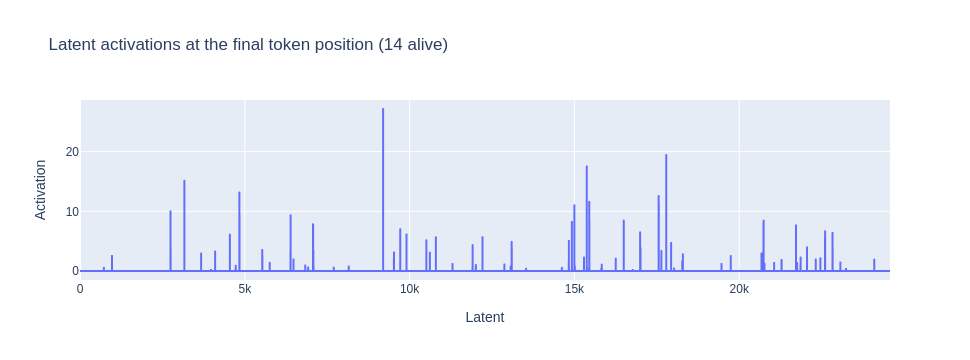

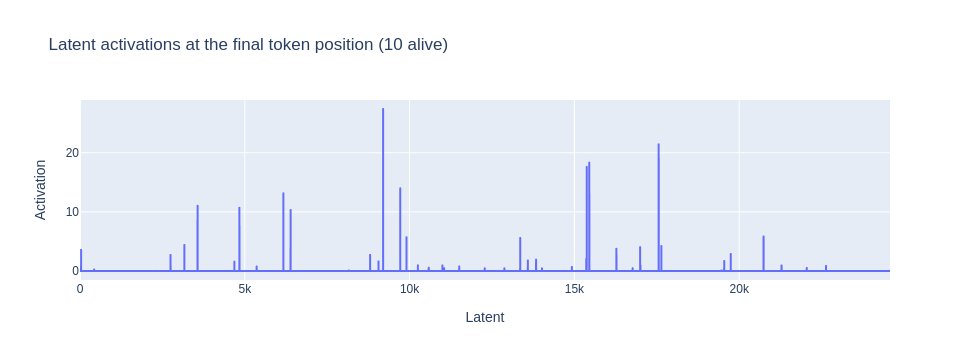

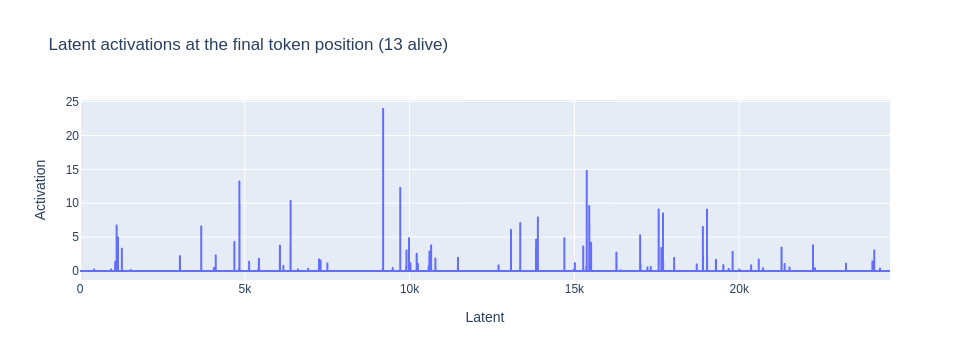

In [114]:
sample = 0
while sample < 10:
    px.line(
        only_bond_cache[sample, 11, :].cpu().numpy(),
        title=f"Latent activations at the final token position ({only_bond_cache[sample, 0, :].nonzero().numel()} alive)",
        labels={"index": "Latent", "value": "Activation"},
        width=1000,
    ).update_layout(showlegend=False).show()
    sample += 1